In [ ]:
import os
os.chdir("/content/drive/MyDrive/Hard Hat Detection")

In [ ]:
!pwd

/content/drive/MyDrive/Hard Hat Detection


In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5.git  # clone repo

Cloning into 'yolov5'...
remote: Enumerating objects: 15965, done.
remote: Counting objects: 100% (134/134), done.
remote: Compressing objects: 100% (64/64), done.
remote: Total 15965 (delta 83), reused 108 (delta 70), pack-reused 15831
Receiving objects: 100% (15965/15965), 14.60 MiB | 13.97 MiB/s, done.
Resolving deltas: 100% (10956/10956), done.


In [ ]:
%cd yolov5

/content/drive/MyDrive/Hard Hat Detection/yolov5


In [ ]:
!pwd

/content/drive/MyDrive/Hard Hat Detection/yolov5


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 15.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 593.5/593.5 kB 58.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.8 MB/s eta 0:00:00


In [ ]:
from IPython.display import Image, clear_output  # to display images

In [ ]:
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.0.1+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


In [ ]:
%cd ..

/content/drive/MyDrive/Hard Hat Detection


In [ ]:
!unzip train.zip

Streaming output truncated to the last 5000 lines.
  inflating: train/images/004860_jpg.rf.30891661565c24df6ee7070789f742a1.jpg  
  inflating: train/images/004861_jpg.rf.e294cee4a7ded35431d02e219ed984e4.jpg  
  inflating: train/images/004862_jpg.rf.1f434f5b908ba019421c15e46e68ba5c.jpg  
  inflating: train/images/004863_jpg.rf.58f7a4aa9837a4eec0d620835a9dcca1.jpg  
  inflating: train/images/004864_jpg.rf.69b86512759cebd0f1599f0a574f9de2.jpg  
  inflating: train/images/004865_jpg.rf.579c80144cd75bbce844424fd9dcf3e4.jpg  
  inflating: train/images/004866_jpg.rf.dc79ecaaad1d6e1d3ff53f14344acba8.jpg  
  inflating: train/images/004867_jpg.rf.394048e23d4f979c725b289dd2ddd023.jpg  
  inflating: train/images/004868_jpg.rf.cbdc7f3d5774c489a6b5569e9237c432.jpg  
  inflating: train/images/004869_jpg.rf.3eac65d727626f4805074bf5656c0e79.jpg  
  inflating: train/images/004870_jpg.rf.f456773d05ec820e0bb4a1eb728d376b.jpg  
  inflating: train/images/004871_jpg.rf.ab916e0ee22bdd34fd7387f77557fdae.jpg  
 

In [ ]:
!unzip test.zip

Archive:  test.zip
   creating: test/images/
  inflating: test/images/005298_jpg.rf.d6fe5e5635be9509610a059a66e432d5.jpg  
  inflating: test/images/005299_jpg.rf.fb7c522d8fc48969a295a287032b53c1.jpg  
  inflating: test/images/005300_jpg.rf.75d17868202e675bdb300b60b8cb2722.jpg  
  inflating: test/images/005301_jpg.rf.e9c1d355a0bb57e4e8d81a36a39042c8.jpg  
  inflating: test/images/005302_jpg.rf.276a11259090a88e935e5982c991757b.jpg  
  inflating: test/images/005303_jpg.rf.cce32679b8fede85699505a2f2624366.jpg  
  inflating: test/images/005304_jpg.rf.86144453ee26db5dc0473f126bfcfeae.jpg  
  inflating: test/images/005305_jpg.rf.33c1ac53f8d734b1d2d685258413e4d4.jpg  
  inflating: test/images/005306_jpg.rf.ff06c340f17557869cc398e5581d9e7a.jpg  
  inflating: test/images/005307_jpg.rf.777d6028849f54ae6c2356cb563f9af0.jpg  
  inflating: test/images/005308_jpg.rf.32d65bf292091a0125c83951e37f091a.jpg  
  inflating: test/images/005309_jpg.rf.1b872d578292b94fc6fdf98addd63a44.jpg  
  inflating: test/i

In [ ]:
%cat data.yaml

train: ../train/images
val: ../test/images

nc: 1
names: ['Hard-Hat']

In [ ]:
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
num_classes

'1'

In [ ]:
#this is the model configuration we will use
%cat yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights 'yolov5s.pt' --name yolov5s_results  --cache

/content/drive/MyDrive/Hard Hat Detection/yolov5
train: weights=yolov5s.pt, cfg=./models/custom_yolov5s.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
fatal: cannot change to '/content/drive/MyDrive/Hard': No such file or directory
YOLOv5 🚀 2023-6-5 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmu

In [ ]:
!pwd

/content/drive/MyDrive/Hard Hat Detection/yolov5


In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!pwd

/content/drive/MyDrive/Hard Hat Detection/yolov5


In [ ]:
!nvidia-smi

Mon Jun  5 20:16:09 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   61C    P8    10W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

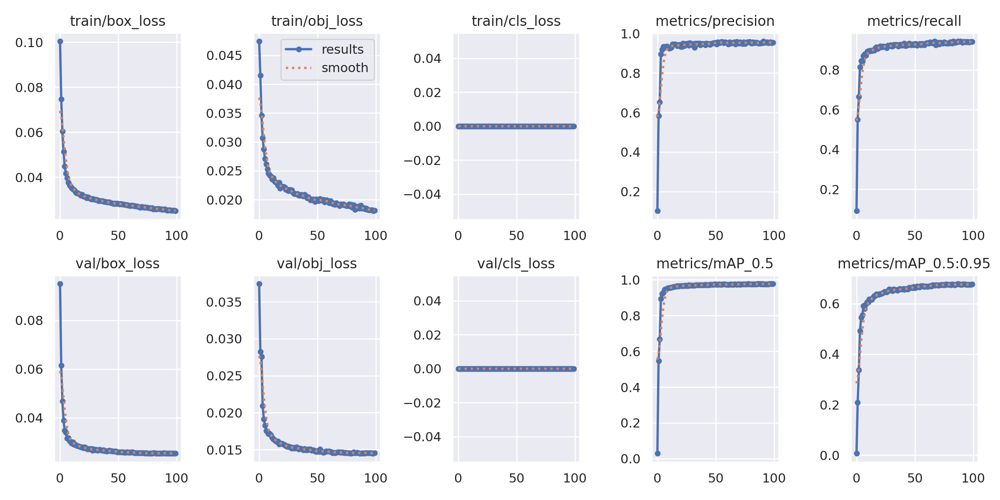

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='runs/train/yolov5s_results/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


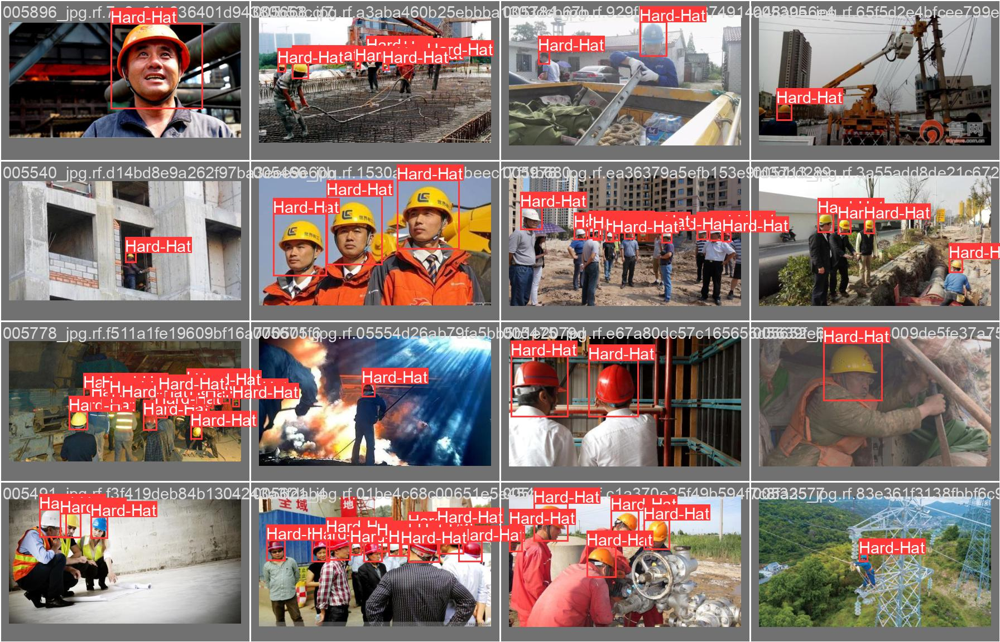

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


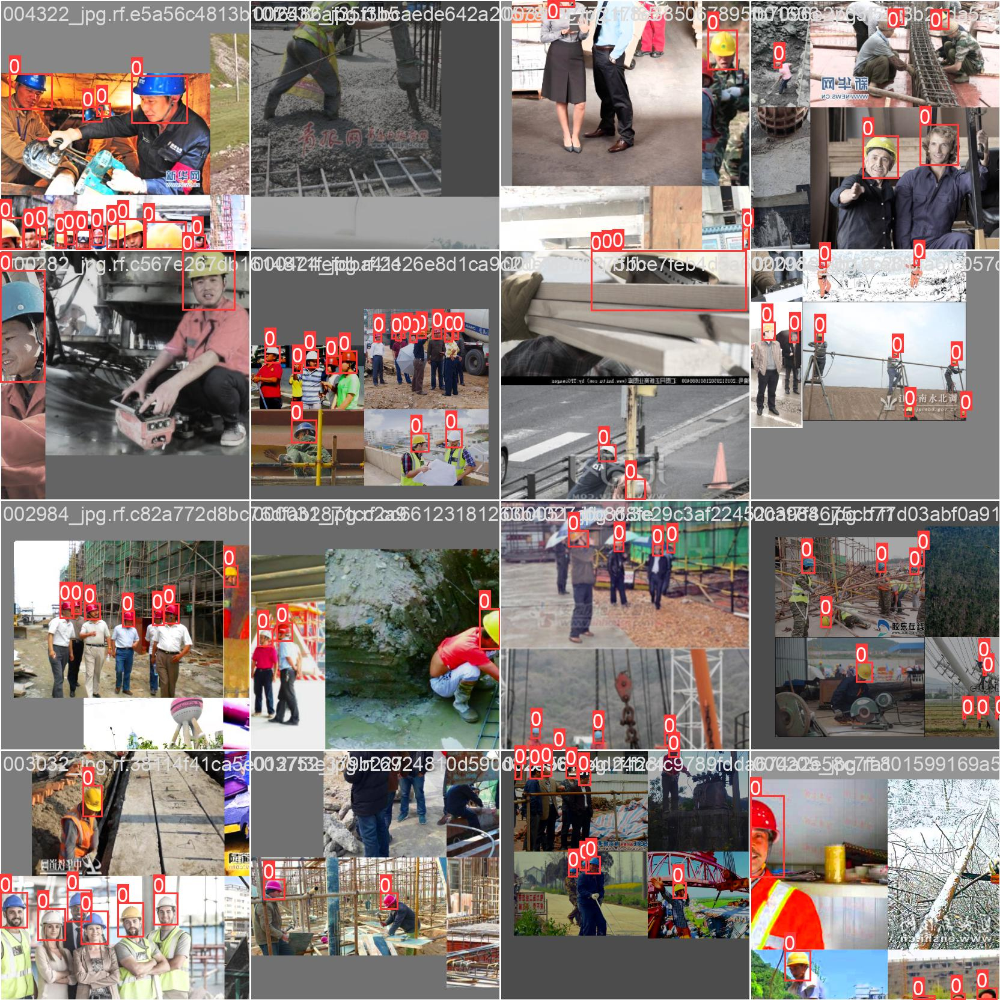

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='runs/train/yolov5s_results/train_batch0.jpg', width=900)

### Run Inference With Trained Weights

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
!pwd

/content/drive/MyDrive/Hard Hat Detection/yolov5


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source ../test/images

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
fatal: cannot change to '/content/drive/MyDrive/Hard': No such file or directory
YOLOv5 🚀 2023-6-5 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7246518 parameters, 0 gradients
image 1/706 /content/drive/MyDrive/Hard Hat Detection/test/images/005298_jpg.rf.d6fe5e5635be9509610a059a66e432d5.jpg: 288x416 8 Hard-Hats, 41.0ms
image 2/706 /content/drive/MyDrive/Hard Hat Detection/test/images/005299_jpg.rf.fb7c522d8fc48969a295a287032b53c1.jpg: 288x416 

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('yolov5/runs/detect/exp*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!pwd

/content/drive/MyDrive/Hard Hat Detection/yolov5


In [ ]:
%cp runs/train/yolov5s_results/weights/best.pt "/content/drive/MyDrive/Hard Hat Detection/model"

In [ ]:
!pip install torch
import torch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pwd

/content/drive/MyDrive/Hard Hat Detection/yolov5


In [ ]:
import torch

In [ ]:
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/Hard Hat Detection/model/best.pt', force_reload=True)

/usr/local/lib/python3.10/dist-packages/torch/hub.py:286: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2023-6-5 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7246518 parameters, 0 gradients
Adding AutoShape... 


In [ ]:
import os

In [ ]:
img = os.path.join('data', 'images', '/content/drive/MyDrive/Hard Hat Detection/test/images/005298_jpg.rf.d6fe5e5635be9509610a059a66e432d5.jpg')

In [ ]:
results = model(img)
results.print()

image 1/1: 332x500 7 Hard-Hats
Speed: 19.8ms pre-process, 2877.9ms inference, 2.1ms NMS per image at shape (1, 3, 448, 640)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

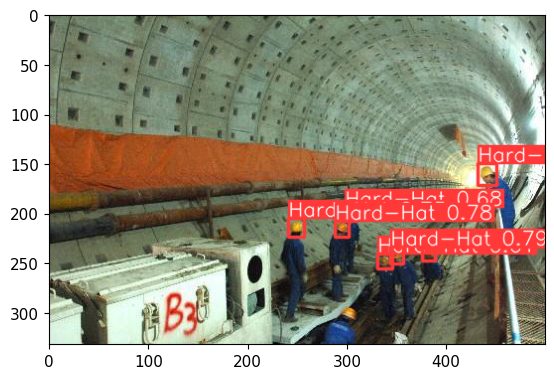

In [ ]:
%matplotlib inline
plt.imshow(np.squeeze(results.render()))
plt.show()

In [ ]:
import os
img1 = os.path.join('data', 'images', '/content/drive/MyDrive/Hard Hat Detection/test/images/005305_jpg.rf.33c1ac53f8d734b1d2d685258413e4d4.jpg')

In [ ]:
results1 = model(img1)
results1.print()

image 1/1: 333x500 1 Hard-Hat
Speed: 13.1ms pre-process, 9.8ms inference, 1.4ms NMS per image at shape (1, 3, 448, 640)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

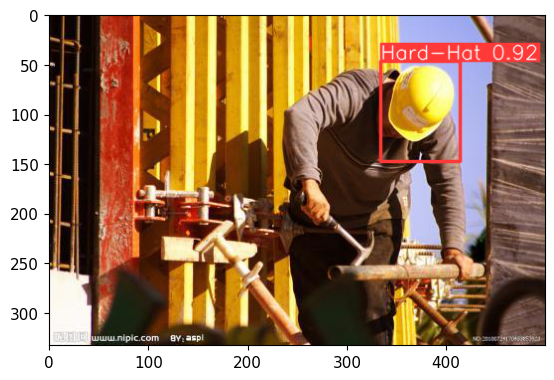

In [ ]:
%matplotlib inline
plt.imshow(np.squeeze(results1.render()))
plt.show()

In [ ]:
import os
img2 = os.path.join('data', 'images', '/content/drive/MyDrive/Hard Hat Detection/test/images/005331_jpg.rf.7660063eeb5806f9aa207d887a153105.jpg')

In [ ]:
results2 = model(img2)
results2.print()

image 1/1: 333x500 13 Hard-Hats
Speed: 13.0ms pre-process, 9.9ms inference, 1.8ms NMS per image at shape (1, 3, 448, 640)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

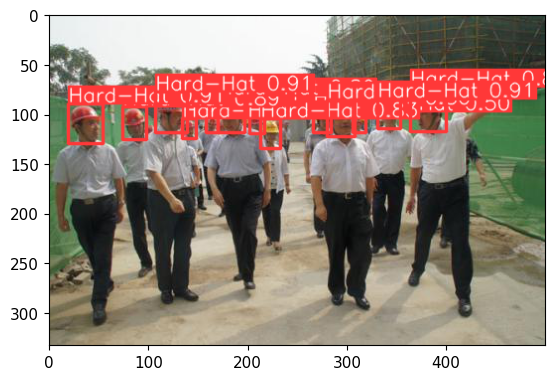

In [ ]:
%matplotlib inline
plt.imshow(np.squeeze(results2.render()))
plt.show()